##Load Data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/SuperAI/kaggle.json ~/.kaggle/     # EDIT HERE: Change your path to your kaggle_json
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle competitions download fruit-ripening

100% 2.17G/2.18G [00:13<00:00, 234MB/s]
100% 2.18G/2.18G [00:13<00:00, 172MB/s]


In [4]:
!unzip /content/fruit-ripening.zip &> /dev/null

In [5]:
import os

base_path = '/content/train/train/'

for i in range(8):
    folder_path = os.path.join(base_path, str(i))
    if os.path.exists(folder_path):
        image_count = len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])
        print(f"Folder {i}: {image_count} images")
    else:
        print(f"Folder {i} doesn't exist.")


Folder 0: 2061 images
Folder 1: 202 images
Folder 2: 127 images
Folder 3: 86 images
Folder 4: 59 images
Folder 5: 53 images
Folder 6: 59 images
Folder 7: 41 images


#Install Timm

In [6]:
# Install Timm (Need to restart the runtime after finish install )
!pip install git+https://github.com/rwightman/pytorch-image-models.git
!pip install lightning transformers datasets evaluate pillow==9.2.0

  Cloning https://github.com/rwightman/pytorch-image-models.git to /tmp/pip-req-build-9x0m75wr
  Running command git clone --filter=blob:none --quiet https://github.com/rwightman/pytorch-image-models.git /tmp/pip-req-build-9x0m75wr
  Resolved https://github.com/rwightman/pytorch-image-models.git to commit 24fc720d3490a2a4f432bf166a38a1fd4b506b3b
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.7 MB/s eta 0:00:00
  Created wheel for timm: filename=timm-0.9.5-py3-none-any.whl size=2190979 sha256=54569455b900fe0c21243f614507871893daa693531b5fac7e83490a4125536a
  Stored in directory: /tmp/pip-ephem-wheel-cache-x95lr6f3/wheels/ed/07/8c/d16ff40e1a6ab5eff4240181152d83e10a933e1973397a1fec
Successfully built timm
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.

In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import DataLoader, random_split, Dataset
from torch.utils.tensorboard import SummaryWriter

# Pytorch Image model (TIMM) library: a library for state-of-the-art image classification
import timm
import timm.optim
import timm.scheduler
from timm.data import ImageDataset, create_dataset, create_loader
from timm.data.transforms_factory import create_transform

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from PIL import Image

import evaluate

import numpy as np
import pandas as pd
from scipy import stats

from tqdm.notebook import tqdm

import glob

from sklearn.model_selection import StratifiedKFold,KFold

from lightning.fabric import Fabric

from copy import copy

import shutil

from sklearn.utils.class_weight import compute_class_weight

##visualization Model

In [2]:
# try:
#     from torchinfo import summary
# except:
#     print("[INFO] Couldn't find torchinfo... installing it.")
#     !pip install -q torchinfo
#     from torchinfo import summary

In [3]:
# # Select model (List of available is shown above)
# model = "hf_hub:timm/tf_efficientnet_b7.ns_jft_in1k"
# model_model= timm.create_model(model, pretrained=True, num_classes=8)
# # Print a summary using torchinfo (uncomment for actual output)
# summary(model=model_model,
#         input_size=(16, 3, 224, 224), # make sure this is "input_size", not "input_shape"
#         # col_names=["input_size"], # uncomment for smaller output
#         col_names=["input_size", "output_size", "num_params", "trainable"],
#         col_width=20,
#         row_settings=["var_names"]
# )

In [4]:
# Transform image data based on ImageNet's mean and std
transforms = {
    "train": T.Compose([
        T.Resize((384, 384)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ]),
    "test": T.Compose([
        T.Resize((384, 384)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ])
}

In [5]:
train_dir = '/content/train/train'

In [6]:
# Use ImageFolder to create dataset(s)
from torchvision import datasets
dataset = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=transforms["train"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [7]:
dataset.class_to_idx

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7}

In [8]:
len(dataset)

2688

In [9]:
# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [10]:
#Select Model
model_name = "hf_hub:timm/tf_efficientnet_b7.ns_jft_in1k"

In [11]:
num_epochs = 10
criterion = nn.CrossEntropyLoss()

# Cross Validation Configuration
k_splits = 5
metric = evaluate.load("f1")

In [12]:
import os
from sklearn.model_selection import StratifiedKFold

base_path = '/content/train/train/'
num_folds = 5  # Number of folds for StratifiedKFold

image_paths = []
labels = []

# Collect image paths and labels based on folder name
for i in range(8):
    folder_path = os.path.join(base_path, str(i))
    if os.path.exists(folder_path):
        images_in_folder = [os.path.join(folder_path, name) for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))]
        image_paths.extend(images_in_folder)
        labels.extend([i] * len(images_in_folder))  # Assign label based on folder index

skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)


In [11]:
# # Cross validation
# kf = KFold(n_splits=k_splits, shuffle=True, random_state=42)

In [13]:
# Gradient Accumulation Settings
# Set to 1 for no accumulation
train_batch_size = 8
eval_batch_size = 4
num_accumulate = 2

In [14]:
torch.set_float32_matmul_precision('high')
fabric = Fabric(accelerator="cuda") # , precision="16-mixed"
fabric.launch()

In [15]:
import time

In [16]:
import os
from sklearn.model_selection import StratifiedKFold
import torch
from torch.utils.data import Dataset, DataLoader

# Define your custom dataset class if not already defined
class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load and preprocess the image if needed
        image = Image.open(self.image_paths[idx])  # Replace with your image loading function
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label


In [17]:
%%time
all_eval_scores = []
writer = SummaryWriter()

for fold, (train_index, val_index) in enumerate(skf.split(image_paths, labels)):

    train_paths = [image_paths[i] for i in train_index]
    val_paths = [image_paths[i] for i in val_index]

    train_labels = [labels[i] for i in train_index]
    val_labels = [labels[i] for i in val_index]

    # Create Subset datasets
    train_dataset = CustomDataset(train_paths, train_labels, transform=transforms["train"])
    val_dataset = CustomDataset(val_paths, val_labels, transform=transforms["test"])
    print(f"Fold {fold+1} of {k_splits}")

    # Load Model
    model = timm.create_model(model_name, pretrained=True, num_classes=8)


    # Load Optimizer and Scheduler
    optimizer = timm.optim.create_optimizer_v2(model, opt="AdamW", lr=5e-4)
    # optimizer = timm.optim.Lookahead(optimizer, alpha=0.5, k=6)    # update the slow weight every k steps
                                                                   # update the optimizer by combine slow weight and fast weight * alpha

    model, optimizer = fabric.setup(model, optimizer)

    scheduler = timm.scheduler.create_scheduler_v2(optimizer, num_epochs=num_epochs)[0]

    # Load Data: split train and valition set based on kfold


    train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_dataloader = DataLoader(val_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=2, pin_memory=True)

    train_dataloader, val_dataloader = fabric.setup_dataloaders(train_dataloader, val_dataloader)

    # Reset Model Info
    info = {
        "metric_train": [],
        "metric_val": [],
        "train_loss": [],
        "val_loss": [],
        "best_metric_val": -999,
        "best_val_loss": 999,
    }

    for epoch in range(num_epochs):
        train_loss_epoch = []
        val_loss_epoch = []

        train_preds = []
        train_targets = []

        val_preds = []
        val_targets = []

        num_updates = epoch * len(train_dataloader)

        ### === Train Loop === ###
        ## Time
        s1 = time.time()

        model.train()
        for idx, batch in enumerate(tqdm(train_dataloader)):
            inputs, targets = batch
            # inputs = {k: v.to(device) for k,v in inputs.items()}
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            writer.add_scalar("Loss/train", loss, epoch)

            fabric.backward(loss)

            # === Gradient Accumulation === #
            if ((idx + 1) % num_accumulate == 0) or (idx + 1 == len(train_dataloader)):
                optimizer.step()
                scheduler.step_update(num_updates=num_updates)
                optimizer.zero_grad()
            # ============================= #

            train_loss_epoch.append(loss.item())
            train_preds += outputs.argmax(-1).detach().cpu().tolist()
            train_targets += targets.tolist()
        ### ==================== ###

        # optimizer.sync_lookahead()              # Sync slow weight and fast weight
        scheduler.step(epoch + 1)

        ### === Evaluation Loop === ###
        model.eval()
        with torch.no_grad():
            for batch in tqdm(val_dataloader):
                inputs, targets = batch
                # inputs = {k: v.to(device) for k,v in inputs.items()}
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                # Log Values
                val_loss_epoch.append(loss.item())
                val_preds += outputs.argmax(-1).detach().cpu().tolist()
                val_targets += targets.tolist()
        ### ======================= ###
        ## Time train finish
        s2 = time.time()
        elapsed_time = s2 - s1


        # Log Data
        metric_train = metric.compute(predictions=train_preds, references=train_targets, average='macro')['f1']
        metric_val = metric.compute(predictions=val_preds, references=val_targets, average='macro')['f1']

        info["metric_train"].append(metric_train)
        info["metric_val"].append(metric_val)

        info["train_loss"].append(np.average(train_loss_epoch))
        info["val_loss"].append(np.average(val_loss_epoch))

        if metric_val > info["best_metric_val"]:
        # if info["val_loss"][-1] < info["best_val_loss"]:
            print("New Best Score!")
            # print("New Best Val Loss")
            info["best_metric_val"] = metric_val
            # info["best_val_loss"] = info["val_loss"][-1]
            torch.save(model, f"efficientnet_b7_{fold}.pt")

        writer.flush()
        print(f"Using time of Fold: {fold} | Epoch: {epoch} | {elapsed_time} second ")
        print(info)
        print(f"Fold: {fold} | Epoch: {epoch} | Metric: {metric_val} | Training Loss: {np.average(train_loss_epoch)} | Validation Loss: {np.average(val_loss_epoch)}")

    # save all best metric val
    all_eval_scores.append(info["best_metric_val"])



Fold 1 of 5


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 0 | 226.82623934745789 second 
{'metric_train': [0.33666403756611507], 'metric_val': [0.5819429790973993], 'train_loss': [0.7103228967283682], 'val_loss': [0.3352573755587434], 'best_metric_val': 0.5819429790973993, 'best_val_loss': 999}
Fold: 0 | Epoch: 0 | Metric: 0.5819429790973993 | Training Loss: 0.7103228967283682 | Validation Loss: 0.3352573755587434


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 1 | 229.3456130027771 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176], 'metric_val': [0.5819429790973993, 0.6727766101803689], 'train_loss': [0.7103228967283682, 0.38263793038827504], 'val_loss': [0.3352573755587434, 0.3192301831898038], 'best_metric_val': 0.6727766101803689, 'best_val_loss': 999}
Fold: 0 | Epoch: 1 | Metric: 0.6727766101803689 | Training Loss: 0.38263793038827504 | Validation Loss: 0.3192301831898038


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 2 | 229.50400066375732 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534], 'best_metric_val': 0.6949753389033866, 'best_val_loss': 999}
Fold: 0 | Epoch: 2 | Metric: 0.6949753389033866 | Training Loss: 0.24712636192730839 | Validation Loss: 0.30080356678912534


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

Using time of Fold: 0 | Epoch: 3 | 229.84722185134888 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098], 'best_metric_val': 0.6949753389033866, 'best_val_loss': 999}
Fold: 0 | Epoch: 3 | Metric: 0.6484283756194713 | Training Loss: 0.15844261002957086 | Validation Loss: 0.4389432448863098


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 4 | 230.03577089309692 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746, 0.8912096256368595], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713, 0.8119925941607801], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086, 0.11019603918237503], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098, 0.19813879052360606], 'best_metric_val': 0.8119925941607801, 'best_val_loss': 999}
Fold: 0 | Epoch: 4 | Metric: 0.8119925941607801 | Training Loss: 0.11019603918237503 | Validation Loss: 0.19813879052360606


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

Using time of Fold: 0 | Epoch: 5 | 230.3557050228119 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746, 0.8912096256368595, 0.955645037422393], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713, 0.8119925941607801, 0.8047575393351307], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086, 0.11019603918237503, 0.03348576785393125], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098, 0.19813879052360606, 0.2235703018345687], 'best_metric_val': 0.8119925941607801, 'best_val_loss': 999}
Fold: 0 | Epoch: 5 | Metric: 0.8047575393351307 | Training Loss: 0.03348576785393125 | Validation Loss: 0.2235703018345687


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 6 | 229.92381477355957 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746, 0.8912096256368595, 0.955645037422393, 0.9785671660073965], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713, 0.8119925941607801, 0.8047575393351307, 0.8440654365959244], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086, 0.11019603918237503, 0.03348576785393125, 0.02390868867956284], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098, 0.19813879052360606, 0.2235703018345687, 0.16676723038040817], 'best_metric_val': 0.8440654365959244, 'best_val_loss': 999}
Fold: 0 | Epoch: 6 | Metric: 0.8440654365959244 | Training Loss: 0.02390868867956284 | Validation Loss: 0.16676723038040817


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 7 | 230.7930817604065 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746, 0.8912096256368595, 0.955645037422393, 0.9785671660073965, 0.9934418178452692], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713, 0.8119925941607801, 0.8047575393351307, 0.8440654365959244, 0.8718320400972845], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086, 0.11019603918237503, 0.03348576785393125, 0.02390868867956284, 0.00728437347818466], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098, 0.19813879052360606, 0.2235703018345687, 0.16676723038040817, 0.14092744287760517], 'best_metric_val': 0.8718320400972845, 'best_val_loss': 999}
Fold: 0 | Epoch: 7 | Metric: 0.8718320400972845 | Training Loss: 0.00728437347818466 | Validation Loss: 0.14092744287760517


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 8 | 229.61180901527405 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746, 0.8912096256368595, 0.955645037422393, 0.9785671660073965, 0.9934418178452692, 0.9971853257432005], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713, 0.8119925941607801, 0.8047575393351307, 0.8440654365959244, 0.8718320400972845, 0.8924869062690728], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086, 0.11019603918237503, 0.03348576785393125, 0.02390868867956284, 0.00728437347818466, 0.003164041494609791], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098, 0.19813879052360606, 0.2235703018345687, 0.16676723038040817, 0.14092744287760517, 0.13977261650216688], 'best_metric_val': 0.8924869062690728, 'best_val_loss': 999}
Fold: 0 | Epoch: 8 | Metric: 0.8924869062690728 | Training Los

  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

Using time of Fold: 0 | Epoch: 9 | 229.8164336681366 second 
{'metric_train': [0.33666403756611507, 0.6059082816731176, 0.7364440882932228, 0.8393820719746746, 0.8912096256368595, 0.955645037422393, 0.9785671660073965, 0.9934418178452692, 0.9971853257432005, 1.0], 'metric_val': [0.5819429790973993, 0.6727766101803689, 0.6949753389033866, 0.6484283756194713, 0.8119925941607801, 0.8047575393351307, 0.8440654365959244, 0.8718320400972845, 0.8924869062690728, 0.8903682427490929], 'train_loss': [0.7103228967283682, 0.38263793038827504, 0.24712636192730839, 0.15844261002957086, 0.11019603918237503, 0.03348576785393125, 0.02390868867956284, 0.00728437347818466, 0.003164041494609791, 0.001236274261692689], 'val_loss': [0.3352573755587434, 0.3192301831898038, 0.30080356678912534, 0.4389432448863098, 0.19813879052360606, 0.2235703018345687, 0.16676723038040817, 0.14092744287760517, 0.13977261650216688, 0.13635305447200294], 'best_metric_val': 0.8924869062690728, 'best_val_loss': 999}
Fold: 0 | E

  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 0 | 229.73866200447083 second 
{'metric_train': [0.3496373212264311], 'metric_val': [0.6383592393717954], 'train_loss': [0.6307203728276336], 'val_loss': [0.36857615324616844], 'best_metric_val': 0.6383592393717954, 'best_val_loss': 999}
Fold: 1 | Epoch: 0 | Metric: 0.6383592393717954 | Training Loss: 0.6307203728276336 | Validation Loss: 0.36857615324616844


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 1 | 230.7143428325653 second 
{'metric_train': [0.3496373212264311, 0.6096401168483971], 'metric_val': [0.6383592393717954, 0.7317412677109831], 'train_loss': [0.6307203728276336, 0.34086485057342175], 'val_loss': [0.36857615324616844, 0.25808064523019086], 'best_metric_val': 0.7317412677109831, 'best_val_loss': 999}
Fold: 1 | Epoch: 1 | Metric: 0.7317412677109831 | Training Loss: 0.34086485057342175 | Validation Loss: 0.25808064523019086


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 2 | 231.34541583061218 second 
{'metric_train': [0.3496373212264311, 0.6096401168483971, 0.7701841799366349], 'metric_val': [0.6383592393717954, 0.7317412677109831, 0.765656403919877], 'train_loss': [0.6307203728276336, 0.34086485057342175, 0.21220918082143958], 'val_loss': [0.36857615324616844, 0.25808064523019086, 0.24720121822171712], 'best_metric_val': 0.765656403919877, 'best_val_loss': 999}
Fold: 1 | Epoch: 2 | Metric: 0.765656403919877 | Training Loss: 0.21220918082143958 | Validation Loss: 0.24720121822171712


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 3 | 231.1872980594635 second 
{'metric_train': [0.3496373212264311, 0.6096401168483971, 0.7701841799366349, 0.8022965287739664], 'metric_val': [0.6383592393717954, 0.7317412677109831, 0.765656403919877, 0.8061300897170462], 'train_loss': [0.6307203728276336, 0.34086485057342175, 0.21220918082143958, 0.17863435259168503], 'val_loss': [0.36857615324616844, 0.25808064523019086, 0.24720121822171712, 0.2393402437897344], 'best_metric_val': 0.8061300897170462, 'best_val_loss': 999}
Fold: 1 | Epoch: 3 | Metric: 0.8061300897170462 | Training Loss: 0.17863435259168503 | Validation Loss: 0.2393402437897344


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 4 | 230.4111728668213 second 
{'metric_train': [0.3496373212264311, 0.6096401168483971, 0.7701841799366349, 0.8022965287739664, 0.9001430902555757], 'metric_val': [0.6383592393717954, 0.7317412677109831, 0.765656403919877, 0.8061300897170462, 0.87223438113076], 'train_loss': [0.6307203728276336, 0.34086485057342175, 0.21220918082143958, 0.17863435259168503, 0.08409019696766849], 'val_loss': [0.36857615324616844, 0.25808064523019086, 0.24720121822171712, 0.2393402437897344, 0.17783345105890727], 'best_metric_val': 0.87223438113076, 'best_val_loss': 999}
Fold: 1 | Epoch: 4 | Metric: 0.87223438113076 | Training Loss: 0.08409019696766849 | Validation Loss: 0.17783345105890727


  0%|          | 0/269 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 5 | 229.99683690071106 second 
{'metric_train': [0.3496373212264311, 0.6096401168483971, 0.7701841799366349, 0.8022965287739664, 0.9001430902555757, 0.956366461187784], 'metric_val': [0.6383592393717954, 0.7317412677109831, 0.765656403919877, 0.8061300897170462, 0.87223438113076, 0.9080070996956202], 'train_loss': [0.6307203728276336, 0.34086485057342175, 0.21220918082143958, 0.17863435259168503, 0.08409019696766849, 0.0465798490881668], 'val_loss': [0.36857615324616844, 0.25808064523019086, 0.24720121822171712, 0.2393402437897344, 0.17783345105890727, 0.1579999109163224], 'best_metric_val': 0.9080070996956202, 'best_val_loss': 999}
Fold: 1 | Epoch: 5 | Metric: 0.9080070996956202 | Training Loss: 0.0465798490881668 | Validation Loss: 0.1579999109163224


  0%|          | 0/269 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [18]:
classname = dataset.classes
classname

['0', '1', '2', '3', '4', '5', '6', '7']

In [ ]:
# for fold in range(k_splits):
#     predictions = []
#     references = []

#     # load model
#     loaded_model = torch.load(f"resnetv2_50_checkpoint_fold{fold}.pt")
#     # Evaluation
#     loaded_model.eval()
#     with torch.no_grad():
#         for batch in tqdm(val_dataloader):
#             inputs, targets = batch
#             outputs = loaded_model(inputs.to(device))

#             # Log Values
#             predictions += outputs.argmax(-1).detach().cpu().tolist()
#             references += targets.tolist()

#     print(f"Fold: {fold}")

#     # Confusion matrix
#     cm = confusion_matrix(references, predictions)
#     disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classname)
#     disp.plot()
#     plt.show()

#     # Classification Report
#     print(classification_report(references, predictions, target_names=classname))

In [19]:
classname = dataset.classes
classname

['0', '1', '2', '3', '4', '5', '6', '7']

  0%|          | 0/135 [00:00<?, ?it/s]

Fold: 0


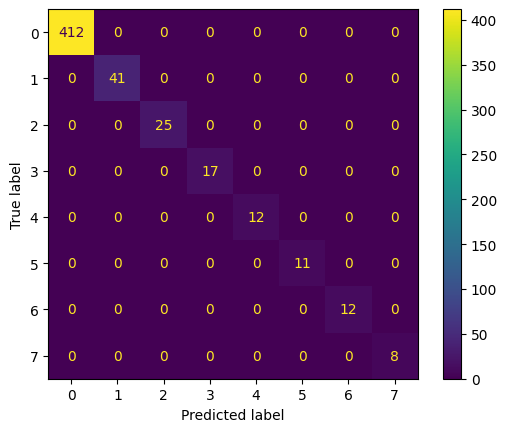

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       412
           1       1.00      1.00      1.00        41
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        17
           4       1.00      1.00      1.00        12
           5       1.00      1.00      1.00        11
           6       1.00      1.00      1.00        12
           7       1.00      1.00      1.00         8

    accuracy                           1.00       538
   macro avg       1.00      1.00      1.00       538
weighted avg       1.00      1.00      1.00       538



In [20]:
predictions = []
references = []

# load model
loaded_model = torch.load(f"/content/efficientnet_b7_0.pt")
# Evaluation
loaded_model.eval()
with torch.no_grad():
    for batch in tqdm(val_dataloader):
        inputs, targets = batch
        outputs = loaded_model(inputs.to(device))

        # Log Values
        predictions += outputs.argmax(-1).detach().cpu().tolist()
        references += targets.tolist()

print(f"Fold: 0")

# Confusion matrix
cm = confusion_matrix(references, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classname)
disp.plot()
plt.show()

# Classification Report
print(classification_report(references, predictions, target_names=classname))

##Visualization train model result

In [21]:
## Making Pridcition return class & prob
from typing import List, Tuple

from PIL import Image
def pred_class(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: T = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    classname =  class_names[target_image_pred_label]
    prob = target_image_pred_probs.max().cpu().numpy()

    return classname , prob

In [22]:
##Load some model
loaded_model = torch.load('/content/efficientnet_b7_0.pt')

##Train data visulization

In [23]:
#Making df for random
import os
import pandas as pd
from PIL import Image

# create an empty list to store image paths
image_paths = []

# loop through each subfolder in the "Image" directory
for root, dirs, files in os.walk('/content/train/train'):
    for subfolder_name in dirs:
        # get the path to the subfolder
        subfolder_path = os.path.join(root, subfolder_name)
        # loop through each file in the subfolder
        for filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, filename)
            image_paths.append((image_path, subfolder_name))

# create a DataFrame from the list of image paths
df = pd.DataFrame(image_paths, columns=['path', 'subfolder_name'])


In [24]:
df.head()

,path,subfolder_name
0,/content/train/train/6/IMG_20220426_175138.png,6
1,/content/train/train/6/IMG_20220426_224932.png,6
2,/content/train/train/6/IMG_20220426_224219.png,6
3,/content/train/train/6/IMG_20220426_223534.png,6
4,/content/train/train/6/IMG_20220426_223531.png,6


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image



def sample_picture(df=df,random_state=None):
    # Sample 20 random rows from the DataFrame
    sample_df = df.sample(20, random_state=random_state).copy()
    sample_df = sample_df.reset_index(drop=True)
    # Define the grid layout for displaying the images
    num_rows = 4
    num_cols = 5
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    fig.tight_layout(pad=5.0)

    # Iterate over the sampled rows and display the images in the grid
    for i, row in sample_df.iterrows():
        img = Image.open(row['path'])

        # Prediction
        pred_name , prob = pred_class(model=loaded_model,image_path=row['path'],
                   class_names = classname,
                   transform=transforms["test"])

        row_idx = i // num_cols
        col_idx = i % num_cols
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('on')
        axs[row_idx, col_idx].set_title(row['subfolder_name'] + ': \nPredict:' + pred_name + '\nProb:'+ str(prob.round(decimals=2)) )

        # prediction


    plt.show()

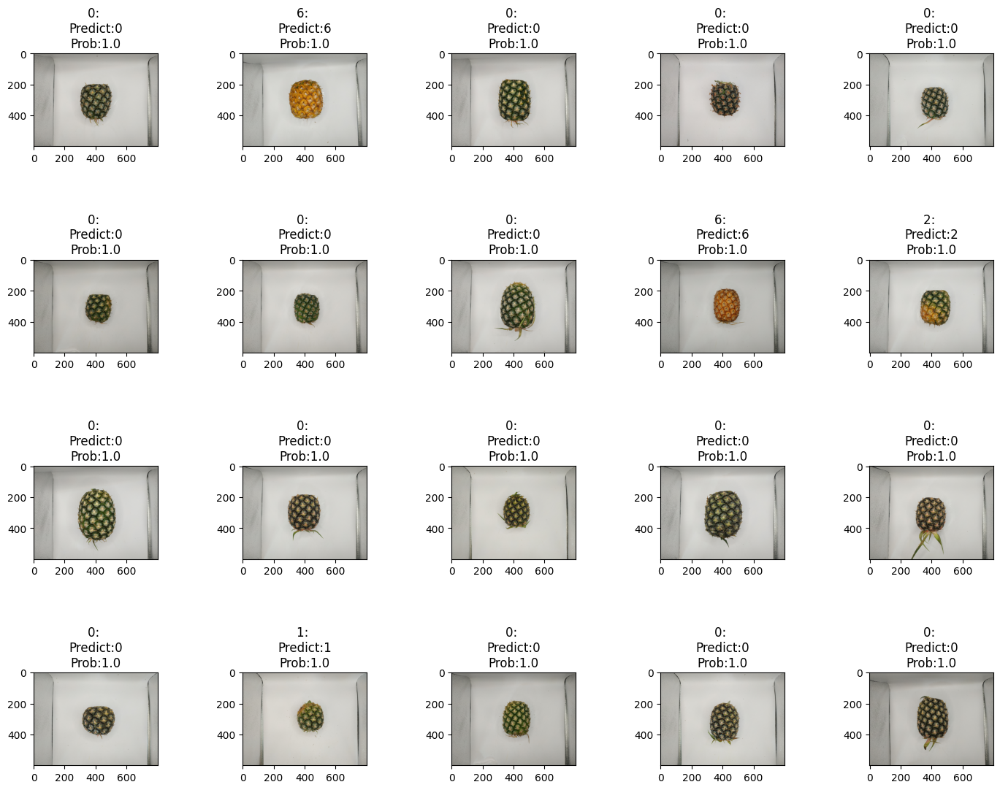

In [26]:
sample_picture()

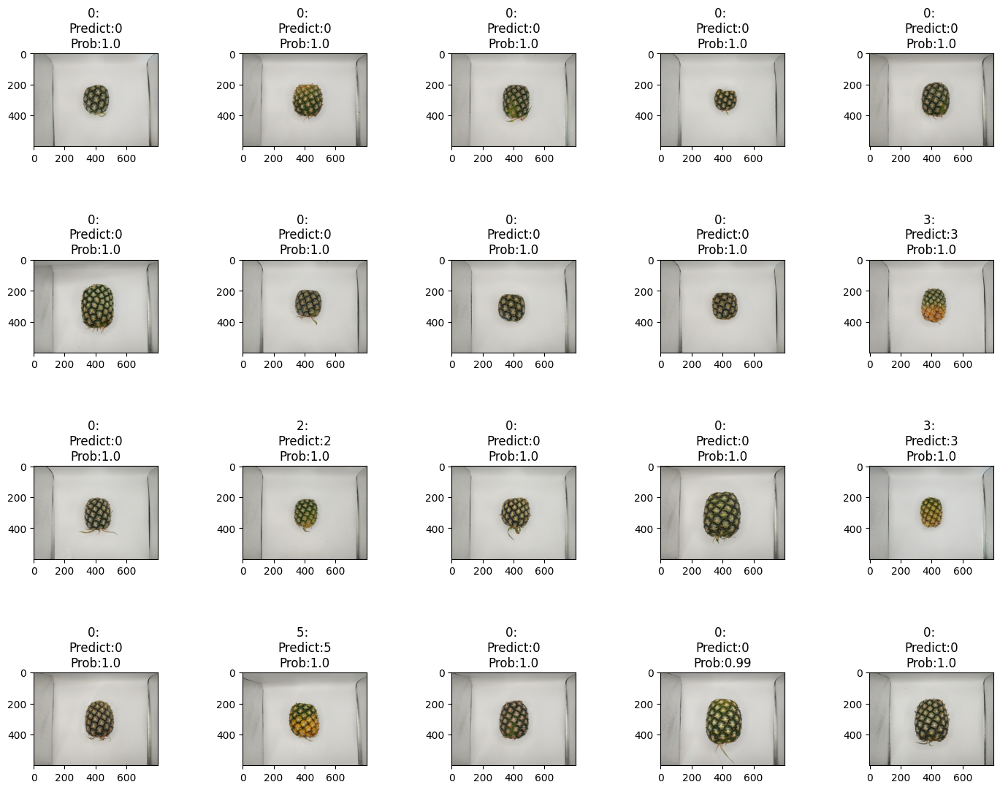

In [27]:
sample_picture()

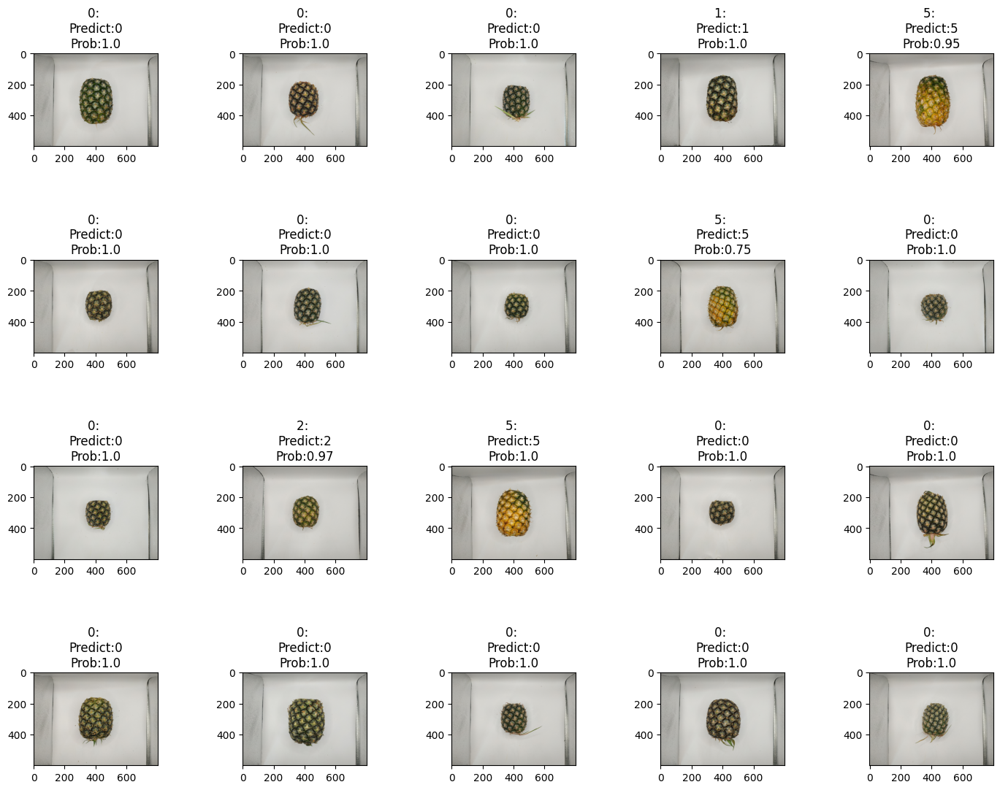

In [28]:
sample_picture()

In [29]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [30]:
%tensorboard --logdir=runs

Output hidden; open in https://colab.research.google.com to view.

In [31]:
test_dir = '/content/test/test'

In [32]:
test_files = glob.glob("/content/test/test/*.png")

In [33]:
test_files[:10]

['/content/test/test/lxth7181.png',
 '/content/test/test/cktr2120.png',
 '/content/test/test/gqov6259.png',
 '/content/test/test/hxpt6605.png',
 '/content/test/test/snji4156.png',
 '/content/test/test/nykr7941.png',
 '/content/test/test/salw0888.png',
 '/content/test/test/zhqo6427.png',
 '/content/test/test/khsx8424.png',
 '/content/test/test/vchc4607.png']

In [34]:
##inferance

In [35]:
import torch

In [36]:
# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [37]:
answers_final = dict()


loaded_model = torch.load("/content/efficientnet_b7_0.pt")

# Evaluation
loaded_model.eval()
with torch.no_grad():
    for f in tqdm(test_files):
        key = f.split("/")[-1]#.split(".")[0]

        img = Image.open(f).convert("RGB")
        transformed = transforms["test"](img).unsqueeze(0).to(device)

        # Collect all predicted value of each fold
        answers_final[key] = loaded_model(transformed).argmax(-1).item()




  0%|          | 0/673 [00:00<?, ?it/s]

In [38]:
answers_final

{'lxth7181.png': 5,
 'cktr2120.png': 0,
 'gqov6259.png': 0,
 'hxpt6605.png': 0,
 'snji4156.png': 0,
 'nykr7941.png': 0,
 'salw0888.png': 0,
 'zhqo6427.png': 0,
 'khsx8424.png': 0,
 'vchc4607.png': 2,
 'dsrh8677.png': 0,
 'xotz7743.png': 0,
 'wpei9181.png': 0,
 'evkf9432.png': 0,
 'uhkn3347.png': 0,
 'vryx2218.png': 0,
 'whdq9736.png': 0,
 'uzwr8537.png': 0,
 'fdkk2059.png': 0,
 'nnjc3912.png': 0,
 'suld6506.png': 0,
 'foyw0641.png': 0,
 'dkdy9566.png': 0,
 'crcc6678.png': 0,
 'cnrd6005.png': 0,
 'pvfm8700.png': 0,
 'nrpy5328.png': 0,
 'bstg2555.png': 0,
 'bumo1648.png': 0,
 'ewqb8519.png': 0,
 'hsqh5023.png': 0,
 'hnqe6451.png': 0,
 'lrtm4138.png': 5,
 'yybd6982.png': 0,
 'ychz2583.png': 0,
 'ijbq1759.png': 0,
 'wojz6823.png': 0,
 'vitv2738.png': 6,
 'eght2393.png': 0,
 'barv3089.png': 0,
 'oojw0270.png': 0,
 'tcga4392.png': 1,
 'tdqe8774.png': 0,
 'bunp8417.png': 2,
 'vlgc4296.png': 0,
 'kyfu1753.png': 3,
 'pdvu9251.png': 0,
 'plrx8443.png': 0,
 'xkdn1032.png': 4,
 'mlyc0221.png': 0,


In [39]:
submission = pd.read_csv('/content/submission.csv')

In [40]:
submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 673 entries, 0 to 672
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   FileName  673 non-null    object 
 1   Class     3 non-null      float64
dtypes: float64(1), object(1)
memory usage: 10.6+ KB


In [41]:
submission["Class"] = submission["FileName"].map(answers_final)

In [42]:
submission

,FileName,Class
0,abdy9380.png,0
1,adua0170.png,0
2,aebq0222.png,5
3,aeew6117.png,0
4,aegl6733.png,0
...,...,...
668,zvxc1988.png,5
669,zyms7894.png,0
670,zzcb3748.png,0
671,zzts1908.png,0


In [43]:
submission.to_csv('tf_efficientnet_b7.csv',index=False)

In [44]:
!cp /content/efficientnet_b7_0.pt /content/drive/MyDrive/SuperAI/230818_Fruit_hack